# Process Mining: Process Discovery

#### Dependencies

In [2]:
import pm4py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

#### Event Log Import

In [ ]:
file_path = r""
complete_log_df = pm4py.read_xes(file_path)
print("Log loaded. Type:", type(complete_log_df))

c:\Users\compt\AppData\Local\Programs\Python\Python310\lib\site-packages\pm4py\util\dt_parsing\parser.py:82: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


parsing log, completed traces ::   0%|          | 0/6449 [00:00<?, ?it/s]

Log loaded. Type: <class 'pandas.core.frame.DataFrame'>


## Variants: Complete Log

In [4]:
def get_n_print_variants(event_log, log_name):
    variant_dictonary = pm4py.get_variants(
        event_log,
        activity_key='concept:name',
        case_id_key='case:concept:name',
        timestamp_key='time:timestamp'
    )

    print(f"The {sum(variant_dictonary.values())} traces in the {log_name} have {len(variant_dictonary)} variants")

    return variant_dictonary

In [5]:
variants_complete_log = get_n_print_variants(complete_log_df, log_name="Complete Log")

The 6449 traces in the Complete Log have 753 variants


In [6]:
def top_N_variants_Pareto_chart(variants, Top_N, log_name):

    variant_stats = sorted(variants.items(), key=lambda x: x[1], reverse=True)

    top_variant_stats = variant_stats[:Top_N]

    x = [f"V{i+1}" for i in range(len(top_variant_stats))]
    y = [v[1] for v in top_variant_stats]

    cumulative = np.cumsum(y)
    cumulative_percent = cumulative / cumulative[-1] * 100

    fig, ax1 = plt.subplots(figsize=(24, 6))

    ax1.bar(x, y, color='blue')
    ax1.set_ylabel('Frequency', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    ax2 = ax1.twinx()
    ax2.plot(x, cumulative_percent, color='red', marker='o')
    ax2.set_ylabel('Cumulative %', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.axhline(80, color='gray', linestyle='--')

    plt.title(f"Pareto Chart of Trace Variants from {log_name}")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

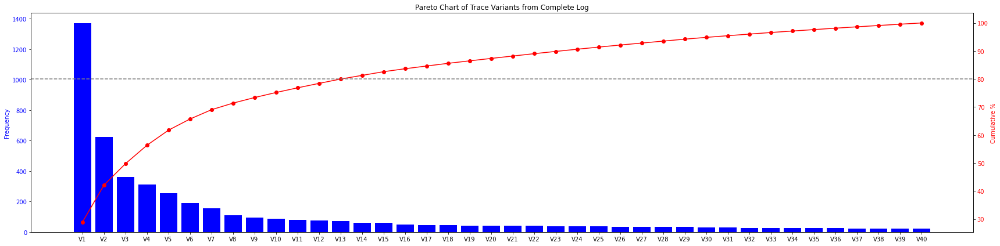

In [7]:
top_N_variants_Pareto_chart(variants_complete_log, Top_N=40, log_name="Complete Log")

In [8]:
def display_variants_head_or_tail(variants, head_or_tail, Top_N):

    total_cases = sum(variants.values())

    data = []
    for i, (variant_str, count) in enumerate(sorted(variants.items(), key=lambda x: x[1], reverse=True)):
        variant_id = f"V{i+1}"
        percent = (count / total_cases) * 100
        data.append({
            "variant_id": variant_id,
            "variant_str": variant_str,
            "count": count,
            "percent": round(percent, 2)
        })

    variant_df = pd.DataFrame(data)

    if head_or_tail == "head":
        sorted_df = variant_df.sort_values(by='count', ascending=False).head(Top_N)
    elif head_or_tail == "tail":
        sorted_df = variant_df.sort_values(by='count', ascending=True).head(Top_N)

    styled_df = sorted_df.style.set_properties(**{
        'text-align': 'center'
        }).set_table_styles([
            {'selector': 'th', 'props': [('text-align', 'center')]},
            {'selector': 'td:nth-child(1)', 'props': [('text-align', 'Left')]}  
        ]).hide(axis="index")  

    display(styled_df)

### Top 5 Variants: Complete Log

In [9]:
display_variants_head_or_tail(variants_complete_log, head_or_tail="head", Top_N=5)

variant_id,variant_str,count,percent
V1,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",1369,21.230000
V2,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by BUDGET OWNER', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",624,9.680000
V3,"('Permit SUBMITTED by EMPLOYEE', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",361,5.600000
V4,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by ADMINISTRATION', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",311,4.820000
V5,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by PRE_APPROVER', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",254,3.940000


### Bottom 5 Variants: Complete Log

In [10]:
display_variants_head_or_tail(variants_complete_log, head_or_tail="tail", Top_N=5)

variant_id,variant_str,count,percent
V738,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by SUPERVISOR', 'Permit FINAL_APPROVED by DIRECTOR', 'Permit REJECTED by MISSING', 'Permit SUBMITTED by EMPLOYEE', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",1,0.020000
V539,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Send Reminder', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by ADMINISTRATION', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",1,0.020000
V538,"('Start trip', 'End trip', 'Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by BUDGET OWNER', 'Permit REJECTED by SUPERVISOR', 'Permit REJECTED by EMPLOYEE', 'Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by BUDGET OWNER', 'Permit FINAL_APPROVED by SUPERVISOR', 'Send Reminder', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')",1,0.020000
V537,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by BUDGET OWNER', 'Permit APPROVED by SUPERVISOR', 'Permit FINAL_APPROVED by DIRECTOR', 'Start trip', 'Declaration SUBMITTED by EMPLOYEE', 'End trip', 'Declaration REJECTED by ADMINISTRATION', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration APPROVED by SUPERVISOR', 'Declaration FINAL_APPROVED by DIRECTOR', 'Request Payment', 'Payment Handled')",1,0.020000
V536,"('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit FINAL_APPROVED by SUPERVISOR', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Start trip', 'Payment Handled', 'End trip')",1,0.020000


## Process Tree Discovery: Inductive Miner

In [11]:
def discover_multiple_process_trees(event_log, thresholds, show=False):

    process_trees = []

    for threshold in thresholds:

        process_tree = pm4py.discover_process_tree_inductive(
            event_log,
            activity_key='concept:name',
            case_id_key='case:concept:name',
            timestamp_key='time:timestamp',
            noise_threshold= threshold
        )

        if show: 
            print(f"process_tree_{threshold}")
            pm4py.view_process_tree(process_tree, format='png')

        process_trees.append((f"process_tree_{threshold}", process_tree))

    return process_trees

process_tree_0.0


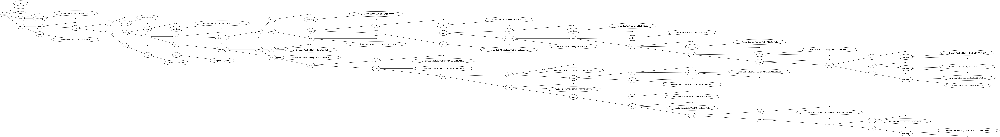

process_tree_0.1


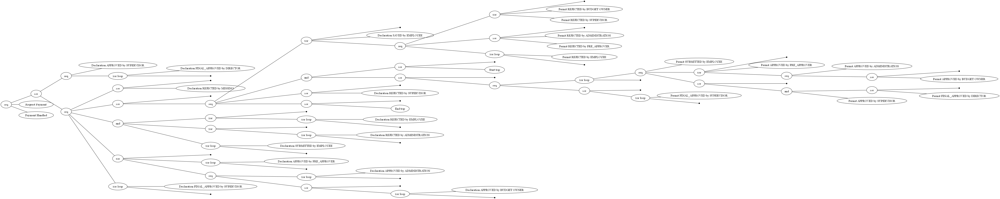

process_tree_0.2


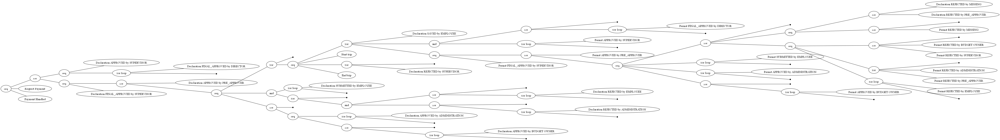

process_tree_0.3


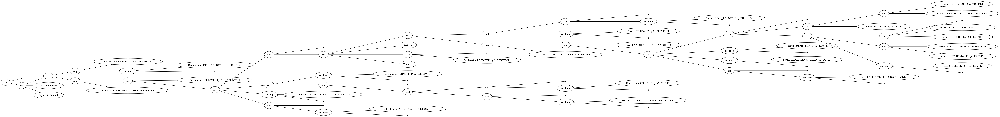

process_tree_0.4


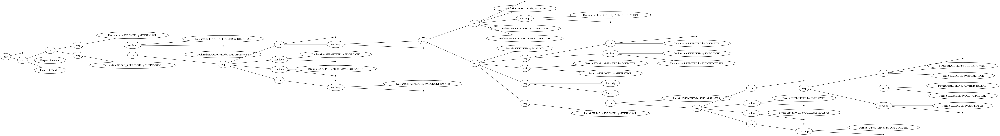

In [12]:
complete_process_trees = discover_multiple_process_trees(complete_log_df, thresholds=[0.0, 0.1, 0.2, 0.3, 0.4], show=True)

## Process Tree Convertion to Petri Net

In [13]:
def convert_multiple_Process_Trees_to_Petri_Nets(process_trees, show=False):

    petri_nets = []

    for name, process_tree in process_trees:
        net, initial_marking, final_marking = pm4py.convert_to_petri_net(process_tree)
        petri_nets.append((f"Petri_Net_{name[-3:]}", net, initial_marking, final_marking))

        if show: 
            print(f"Petri_Net_{name[-3:]}")
            pm4py.view_petri_net(net, initial_marking, final_marking, format='png') 

    return petri_nets

Petri_Net_0.0


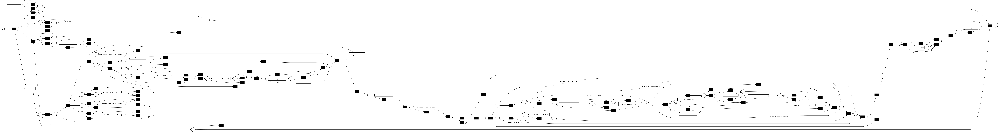

Petri_Net_0.1


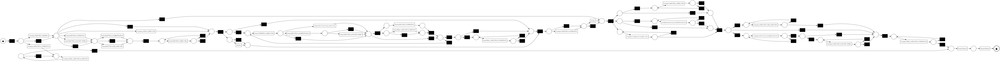

Petri_Net_0.2


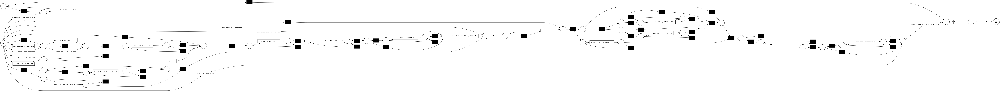

Petri_Net_0.3


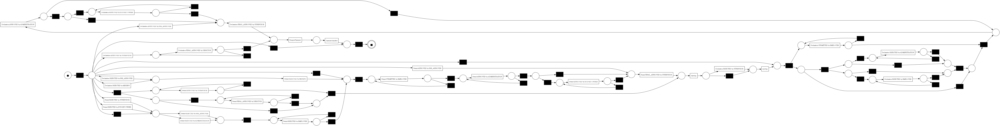

Petri_Net_0.4


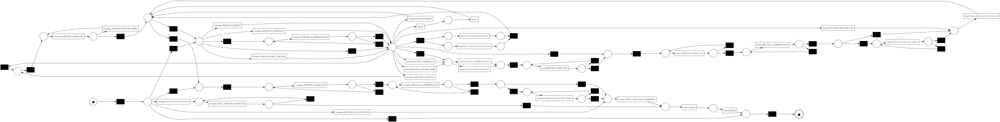

In [14]:
complete_Petri_Nets = convert_multiple_Process_Trees_to_Petri_Nets(complete_process_trees, show=True)

## Petri Net Evaluation

In [ ]:
class PetriNetEvaluator:
    def __init__(self, event_log, net, im, fm):
        self.event_log = event_log
        self.net = net
        self.im = im
        self.fm = fm

    def evaluate_fitness(self):
        fitness = pm4py.fitness_token_based_replay(
            self.event_log,
            self.net,
            self.im,
            self.fm,
            activity_key='concept:name',
            case_id_key='case:concept:name',
            timestamp_key='time:timestamp'
        )
        return fitness
    
    def evaluate_precision(self):
        precision = pm4py.precision_token_based_replay(
            self.event_log,
            self.net,
            self.im,
            self.fm,
            activity_key='concept:name',
            case_id_key='case:concept:name',
            timestamp_key='time:timestamp'
        )
        return precision

    def evaluate_generalization(self):
        from pm4py.algo.evaluation.generalization import algorithm as generalization_factory
        generalization = generalization_factory.apply(self.event_log, self.net, self.im, self.fm)
        return generalization

    def evaluate_simplicity(self):
        from pm4py.algo.evaluation.simplicity import algorithm as simplicity_factory
        simplicity = simplicity_factory.apply(self.net)
        return simplicity

    def evaluate_all(self):
        full_fitness = self.evaluate_fitness()
        fitness_avg = full_fitness.get("average_trace_fitness")
        fitness_perc = full_fitness.get("perc_fit_traces")
        precision = self.evaluate_precision()
        generalization = self.evaluate_generalization()
        simplicity = self.evaluate_simplicity()
        f1_score = 2 * (precision * fitness_avg) / (precision + fitness_avg)

        results = {
            "fitness_avg": fitness_avg,
            "fitness_perc_fit_traces": fitness_perc,
            "precision": precision,
            "generalization": generalization,
            "simplicity": simplicity,
            "f1_score": f1_score
        }
        return results

In [ ]:
results = []

for name, net, im, fm in complete_Petri_Nets:
    evaluator = PetriNetEvaluator(complete_log_df, net, im, fm)
    metrics = evaluator.evaluate_all()
    metrics["model_name"] = name
    results.append(metrics)

df = pd.DataFrame(results)

cols = ["model_name", "fitness_avg", "fitness_perc_fit_traces", "precision", "generalization", "simplicity", "f1_score"]
df = df[cols]

styled_df = df.style.set_properties(**{
    'text-align': 'center'
}).set_table_styles([
    {'selector': 'th', 'props': [('text-align', 'center')]},
    {'selector': 'td:nth-child(1)', 'props': [('text-align', 'Left')]}
]).hide(axis="index")

display(styled_df)

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/4077 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/4077 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/4077 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/4077 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/4077 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

model_name,fitness_avg,fitness_perc_fit_traces,precision,generalization,simplicity,f1_score
Petri_Net_0.0,0.971365,6.946813,0.225696,0.876672,0.622222,0.366286
Petri_Net_0.1,0.980931,66.072259,0.356559,0.911931,0.641509,0.523010
Petri_Net_0.2,0.941366,45.154287,0.338725,0.860729,0.640000,0.498189
Petri_Net_0.3,0.934303,45.154287,0.326071,0.858766,0.658031,0.483426
Petri_Net_0.4,0.954289,38.920763,0.216777,0.864635,0.649718,0.353299


## Choice of Normative Model

Petri_Net_0.1, Petri_Net_0.2 and Petri_Net_0.3 have similar F1 score, however the latter has higher simplicity. To decide which Petri Net to choose as our normative model, let's look at their graphs.  

### Direct Follow Graphs

In [ ]:
def extract_confirming_log_from_Petri_Net(event_log, net, im, fm):

    from pm4py.objects.conversion.log import converter as log_converter
    from pm4py.algo.conformance.tokenreplay import algorithm as token_replay

    event_log_list = log_converter.apply(event_log, parameters={
        log_converter.Variants.TO_EVENT_LOG.value.Parameters.CASE_ID_KEY: "case:concept:name"
    })

    replay_results = token_replay.apply(event_log_list, net, im, fm)

    conforming_trace_indices = [
        idx for idx, result in enumerate(replay_results) if  result["trace_is_fit"]
    ]

    print("Number of conforming traces:", len(conforming_trace_indices))

    conforming_case_ids = [
        trace.attributes["concept:name"]
        for idx, trace in enumerate(event_log_list)
        if replay_results[idx]["trace_is_fit"]
    ]

    df_conforming = event_log[event_log["case:concept:name"].isin(conforming_case_ids)].copy()

    return df_conforming  

replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

Number of conforming traces: 4261


replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

Number of conforming traces: 2912


replaying log with TBR, completed traces ::   0%|          | 0/753 [00:00<?, ?it/s]

Number of conforming traces: 2912
Direct Follow Graph from traces conforming to Petri_Net_0.1


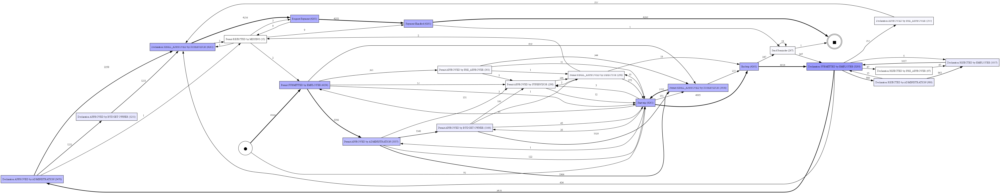

Direct Follow Graph from traces conforming to Petri_Net_0.2


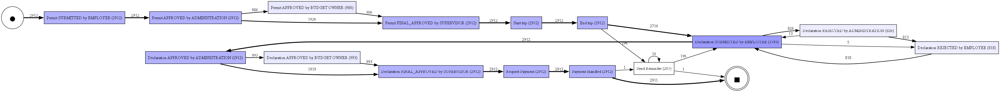

Direct Follow Graph from traces conforming to Petri_Net_0.3


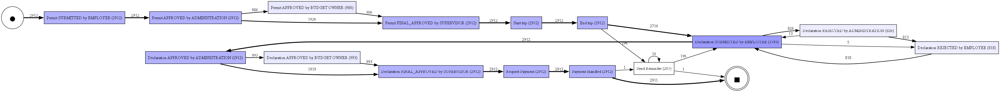

In [24]:
conforming_log_01_df = extract_confirming_log_from_Petri_Net(complete_log_df, complete_Petri_Nets[1][1], complete_Petri_Nets[1][2], complete_Petri_Nets[1][3])
dfg_01, start_activities_01, end_activities_01 = pm4py.discover_dfg(conforming_log_01_df, case_id_key='case:concept:name', activity_key='concept:name', timestamp_key='time:timestamp')

conforming_log_02_df = extract_confirming_log_from_Petri_Net(complete_log_df, complete_Petri_Nets[2][1], complete_Petri_Nets[2][2], complete_Petri_Nets[2][3])
dfg_02, start_activities_02, end_activities_02 = pm4py.discover_dfg(conforming_log_02_df, case_id_key='case:concept:name', activity_key='concept:name', timestamp_key='time:timestamp')

conforming_log_03_df = extract_confirming_log_from_Petri_Net(complete_log_df, complete_Petri_Nets[3][1], complete_Petri_Nets[3][2], complete_Petri_Nets[3][3])
dfg_03, start_activities_03, end_activities_03 = pm4py.discover_dfg(conforming_log_03_df, case_id_key='case:concept:name', activity_key='concept:name', timestamp_key='time:timestamp')

print("Direct Follow Graph from traces conforming to Petri_Net_0.1")
pm4py.view_dfg(dfg_01, start_activities_01, end_activities_01, format='png')
print("Direct Follow Graph from traces conforming to Petri_Net_0.2")
pm4py.view_dfg(dfg_02, start_activities_02, end_activities_02, format='png')
print("Direct Follow Graph from traces conforming to Petri_Net_0.3")
pm4py.view_dfg(dfg_03, start_activities_03, end_activities_03, format='png')

### BPMN Graphs 

BPNM from Petri_Net_0.1


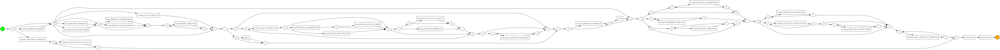

BPNM from Petri_Net_0.2


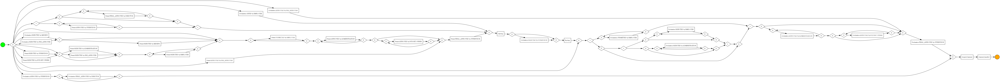

BPNM from Petri_Net_0.3


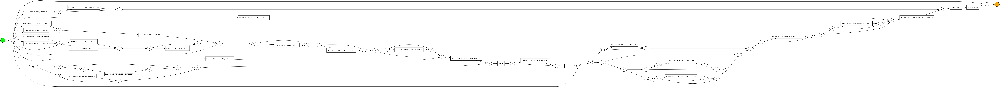

In [26]:
bpmn_graph_01 = pm4py.convert_to_bpmn(complete_Petri_Nets[1][1], complete_Petri_Nets[1][2], complete_Petri_Nets[1][3])
bpmn_graph_02 = pm4py.convert_to_bpmn(complete_Petri_Nets[2][1], complete_Petri_Nets[2][2], complete_Petri_Nets[2][3])
bpmn_graph_03 = pm4py.convert_to_bpmn(complete_Petri_Nets[3][1], complete_Petri_Nets[3][2], complete_Petri_Nets[3][3])

print("BPNM from Petri_Net_0.1")
pm4py.view_bpmn(bpmn_graph_01, format='png')
print("BPNM from Petri_Net_0.2")
pm4py.view_bpmn(bpmn_graph_02, format='png')
print("BPNM from Petri_Net_0.3")
pm4py.view_bpmn(bpmn_graph_03, format='png')

Altough Petri_Net_0.1 has a higher F1-Score, the graphs show that Petri_Net_0.2 and 0.3 have a much more streamlined structure. For this reason, the choice of Normative model is the **Petri_Net_0.2** since it has the highest F1-score compared to Petri_Net_0.3. 

## Export Normative Model

In [ ]:
#file_path = r""
#pm4py.write_pnml(complete_Petri_Nets[2][1], complete_Petri_Nets[2][2], complete_Petri_Nets[2][3], file_path)